In [1]:
!pip install opencv-python

Defaulting to user installation because normal site-packages is not writeable


In [2]:
!pip install tensorflow
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

Defaulting to user installation because normal site-packages is not writeable


In [3]:
### for Jupyter
trainpath = 'Emotion_Detection/train/'
testpath = 'Emotion_Detection/test/'

In [4]:
import os
import glob as gb


for folder in  os.listdir(trainpath ) : 
    files = gb.glob(pathname= str( trainpath + folder + '/*.png'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 3995 in folder angry
For training data , found 436 in folder disgusted
For training data , found 4097 in folder fearful
For training data , found 7215 in folder happy
For training data , found 4965 in folder neutral
For training data , found 4830 in folder sad
For training data , found 3171 in folder surprised


In [5]:
for folder in  os.listdir(testpath ) : 
    files = gb.glob(pathname= str( testpath + folder + '/*.png'))
    print(f'For teasting data , found {len(files)} in folder {folder}')

For training data , found 958 in folder angry
For training data , found 111 in folder disgusted
For training data , found 1024 in folder fearful
For training data , found 1774 in folder happy
For training data , found 1233 in folder neutral
For training data , found 1247 in folder sad
For training data , found 831 in folder surprised


In [6]:
code = {'angry':0 ,'disgusted':1,'fearful':2,'happy':3,'neutral':4,'sad':5,'surprised':6}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y :                        
            return x    

In [7]:
# size of train data
size = []
for folder in  os.listdir(trainpath ) : 
    files = gb.glob(pathname= str( trainpath + folder + '/*.png'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(48, 48)    28709
dtype: int64

In [8]:
# size of test data
size = []
for folder in  os.listdir(testpath ) : 
    files = gb.glob(pathname= str( testpath + folder + '/*.png'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(48, 48)    7178
dtype: int64

# Reshaping the dataset to 3-D to pass it through CNN

In [9]:
image.shape

(48, 48)

In [10]:
image=image.reshape(48,48,1)

In [11]:
image.shape

(48, 48, 1)

In [12]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath ) : 
    files = gb.glob(pathname= str( trainpath + folder + '/*.png'))
    for file in files: 
        print(file)
        image = cv2.imread(file)
        print(image)
        X_train.append(list(image))
        y_train.append(code[folder])

Emotion_Detection/train/angry\im0.png
[[[ 70  70  70]
  [ 80  80  80]
  [ 82  82  82]
  ...
  [ 52  52  52]
  [ 43  43  43]
  [ 41  41  41]]

 [[ 65  65  65]
  [ 61  61  61]
  [ 58  58  58]
  ...
  [ 56  56  56]
  [ 52  52  52]
  [ 44  44  44]]

 [[ 50  50  50]
  [ 43  43  43]
  [ 54  54  54]
  ...
  [ 49  49  49]
  [ 56  56  56]
  [ 47  47  47]]

 ...

 [[ 91  91  91]
  [ 65  65  65]
  [ 42  42  42]
  ...
  [ 72  72  72]
  [ 56  56  56]
  [ 43  43  43]]

 [[ 77  77  77]
  [ 82  82  82]
  [ 79  79  79]
  ...
  [105 105 105]
  [ 70  70  70]
  [ 46  46  46]]

 [[ 77  77  77]
  [ 72  72  72]
  [ 84  84  84]
  ...
  [106 106 106]
  [109 109 109]
  [ 82  82  82]]]
Emotion_Detection/train/angry\im1.png
[[[151 151 151]
  [150 150 150]
  [147 147 147]
  ...
  [129 129 129]
  [140 140 140]
  [120 120 120]]

 [[151 151 151]
  [149 149 149]
  [149 149 149]
  ...
  [122 122 122]
  [141 141 141]
  [137 137 137]]

 [[151 151 151]
  [151 151 151]
  [156 156 156]
  ...
  [109 109 109]
  [123 123 123]


[[[ 11  11  11]
  [ 13  13  13]
  [ 22  22  22]
  ...
  [ 64  64  64]
  [115 115 115]
  [136 136 136]]

 [[ 15  15  15]
  [ 14  14  14]
  [ 42  42  42]
  ...
  [ 44  44  44]
  [114 114 114]
  [120 120 120]]

 [[ 16  16  16]
  [ 17  17  17]
  [ 59  59  59]
  ...
  [ 43  43  43]
  [104 104 104]
  [116 116 116]]

 ...

 [[ 36  36  36]
  [ 49  49  49]
  [ 93  93  93]
  ...
  [ 82  82  82]
  [ 20  20  20]
  [ 12  12  12]]

 [[ 43  43  43]
  [ 87  87  87]
  [114 114 114]
  ...
  [ 81  81  81]
  [ 17  17  17]
  [ 11  11  11]]

 [[ 92  92  92]
  [119 119 119]
  [119 119 119]
  ...
  [ 78  78  78]
  [ 17  17  17]
  [ 12  12  12]]]
Emotion_Detection/train/angry\im1481.png
[[[195 195 195]
  [195 195 195]
  [195 195 195]
  ...
  [194 194 194]
  [196 196 196]
  [195 195 195]]

 [[195 195 195]
  [195 195 195]
  [194 194 194]
  ...
  [201 201 201]
  [193 193 193]
  [195 195 195]]

 [[195 195 195]
  [195 195 195]
  [193 193 193]
  ...
  [197 197 197]
  [195 195 195]
  [195 195 195]]

 ...

 [[  0   0 

[[[ 30  30  30]
  [ 24  24  24]
  [ 21  21  21]
  ...
  [ 37  37  37]
  [ 44  44  44]
  [ 37  37  37]]

 [[ 31  31  31]
  [ 22  22  22]
  [ 21  21  21]
  ...
  [ 37  37  37]
  [ 35  35  35]
  [ 41  41  41]]

 [[ 27  27  27]
  [ 22  22  22]
  [ 19  19  19]
  ...
  [ 33  33  33]
  [ 34  34  34]
  [ 40  40  40]]

 ...

 [[ 29  29  29]
  [ 29  29  29]
  [ 26  26  26]
  ...
  [118 118 118]
  [132 132 132]
  [148 148 148]]

 [[ 30  30  30]
  [ 30  30  30]
  [ 27  27  27]
  ...
  [154 154 154]
  [159 159 159]
  [166 166 166]]

 [[ 32  32  32]
  [ 29  29  29]
  [ 28  28  28]
  ...
  [172 172 172]
  [173 173 173]
  [173 173 173]]]
Emotion_Detection/train/angry\im20.png
[[[254 254 254]
  [253 253 253]
  [253 253 253]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [255 255 255]
  [249 249 249]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 255]]

 [[253 253 253]
  [255 255 255]
  [242 242 242]
  ...
  [253 253 253]
  [255 255 255]
  [255 255 255]]

 ...

 [[ 62  62  6

[[[71 71 71]
  [68 68 68]
  [66 66 66]
  ...
  [63 63 63]
  [63 63 63]
  [64 64 64]]

 [[71 71 71]
  [69 69 69]
  [67 67 67]
  ...
  [64 64 64]
  [65 65 65]
  [66 66 66]]

 [[71 71 71]
  [70 70 70]
  [68 68 68]
  ...
  [66 66 66]
  [68 68 68]
  [68 68 68]]

 ...

 [[54 54 54]
  [54 54 54]
  [52 52 52]
  ...
  [25 25 25]
  [24 24 24]
  [24 24 24]]

 [[55 55 55]
  [54 54 54]
  [52 52 52]
  ...
  [25 25 25]
  [24 24 24]
  [25 25 25]]

 [[54 54 54]
  [54 54 54]
  [53 53 53]
  ...
  [25 25 25]
  [25 25 25]
  [24 24 24]]]
Emotion_Detection/train/angry\im2480.png
[[[142 142 142]
  [159 159 159]
  [156 156 156]
  ...
  [ 15  15  15]
  [ 23  23  23]
  [ 54  54  54]]

 [[144 144 144]
  [157 157 157]
  [153 153 153]
  ...
  [ 24  24  24]
  [ 28  28  28]
  [ 56  56  56]]

 [[143 143 143]
  [153 153 153]
  [150 150 150]
  ...
  [ 21  21  21]
  [ 30  30  30]
  [ 39  39  39]]

 ...

 [[151 151 151]
  [150 150 150]
  [143 143 143]
  ...
  [ 42  42  42]
  [ 44  44  44]
  [ 46  46  46]]

 [[147 147 147]

[[[ 47  47  47]
  [ 48  48  48]
  [ 55  55  55]
  ...
  [ 47  47  47]
  [ 44  44  44]
  [ 43  43  43]]

 [[ 49  49  49]
  [ 48  48  48]
  [ 59  59  59]
  ...
  [ 46  46  46]
  [ 44  44  44]
  [ 43  43  43]]

 [[ 49  49  49]
  [ 50  50  50]
  [ 61  61  61]
  ...
  [ 44  44  44]
  [ 41  41  41]
  [ 36  36  36]]

 ...

 [[ 25  25  25]
  [ 25  25  25]
  [ 26  26  26]
  ...
  [219 219 219]
  [213 213 213]
  [205 205 205]]

 [[ 23  23  23]
  [ 25  25  25]
  [ 25  25  25]
  ...
  [213 213 213]
  [213 213 213]
  [219 219 219]]

 [[ 24  24  24]
  [ 24  24  24]
  [ 24  24  24]
  ...
  [218 218 218]
  [212 212 212]
  [227 227 227]]]
Emotion_Detection/train/angry\im2925.png
[[[170 170 170]
  [180 180 180]
  [147 147 147]
  ...
  [ 65  65  65]
  [ 69  69  69]
  [ 79  79  79]]

 [[188 188 188]
  [165 165 165]
  [138 138 138]
  ...
  [ 63  63  63]
  [ 47  47  47]
  [ 58  58  58]]

 [[183 183 183]
  [147 147 147]
  [134 134 134]
  ...
  [ 75  75  75]
  [ 46  46  46]
  [ 31  31  31]]

 ...

 [[197 197 

[[[241 241 241]
  [208 208 208]
  [193 193 193]
  ...
  [146 146 146]
  [172 172 172]
  [184 184 184]]

 [[229 229 229]
  [203 203 203]
  [194 194 194]
  ...
  [130 130 130]
  [156 156 156]
  [172 172 172]]

 [[221 221 221]
  [205 205 205]
  [193 193 193]
  ...
  [123 123 123]
  [148 148 148]
  [164 164 164]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  1   1   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  1   1   1]
  [  5   5   5]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
Emotion_Detection/train/angry\im3389.png
[[[159 159 159]
  [134 134 134]
  [152 152 152]
  ...
  [ 40  40  40]
  [ 88  88  88]
  [149 149 149]]

 [[153 153 153]
  [133 133 133]
  [161 161 161]
  ...
  [ 38  38  38]
  [ 62  62  62]
  [123 123 123]]

 [[150 150 150]
  [129 129 129]
  [160 160 160]
  ...
  [ 38  38  38]
  [ 43  43  43]
  [ 88  88  88]]

 ...

 [[ 55  55 

[[[119 119 119]
  [117 117 117]
  [ 91  91  91]
  ...
  [  7   7   7]
  [ 18  18  18]
  [ 23  23  23]]

 [[135 135 135]
  [132 132 132]
  [106 106 106]
  ...
  [  7   7   7]
  [  5   5   5]
  [  4   4   4]]

 [[ 66  66  66]
  [ 77  77  77]
  [ 85  85  85]
  ...
  [  8   8   8]
  [  0   0   0]
  [  3   3   3]]

 ...

 [[ 18  18  18]
  [ 15  15  15]
  [ 20  20  20]
  ...
  [ 14  14  14]
  [ 25  25  25]
  [ 26  26  26]]

 [[ 17  17  17]
  [ 13  13  13]
  [ 16  16  16]
  ...
  [ 12  12  12]
  [ 12  12  12]
  [ 15  15  15]]

 [[ 13  13  13]
  [ 16  16  16]
  [  9   9   9]
  ...
  [ 14  14  14]
  [  5   5   5]
  [  6   6   6]]]
Emotion_Detection/train/angry\im3854.png
[[[ 67  67  67]
  [ 61  61  61]
  [119 119 119]
  ...
  [246 246 246]
  [254 254 254]
  [252 252 252]]

 [[ 65  65  65]
  [ 64  64  64]
  [149 149 149]
  ...
  [232 232 232]
  [254 254 254]
  [251 251 251]]

 [[ 57  57  57]
  [ 90  90  90]
  [164 164 164]
  ...
  [218 218 218]
  [253 253 253]
  [251 251 251]]

 ...

 [[ 48  48 

[[[ 60  60  60]
  [ 64  64  64]
  [ 95  95  95]
  ...
  [224 224 224]
  [239 239 239]
  [245 245 245]]

 [[ 63  63  63]
  [ 86  86  86]
  [130 130 130]
  ...
  [226 226 226]
  [233 233 233]
  [237 237 237]]

 [[ 75  75  75]
  [110 110 110]
  [149 149 149]
  ...
  [227 227 227]
  [226 226 226]
  [223 223 223]]

 ...

 [[167 167 167]
  [164 164 164]
  [164 164 164]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[165 165 165]
  [164 164 164]
  [167 167 167]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[163 163 163]
  [164 164 164]
  [165 165 165]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
Emotion_Detection/train/angry\im715.png
[[[  8   8   8]
  [ 15  15  15]
  [ 35  35  35]
  ...
  [ 12  12  12]
  [ 11  11  11]
  [  3   3   3]]

 [[  8   8   8]
  [ 18  18  18]
  [ 44  44  44]
  ...
  [ 11  11  11]
  [  9   9   9]
  [  4   4   4]]

 [[  8   8   8]
  [ 24  24  24]
  [ 49  49  49]
  ...
  [ 10  10  10]
  [  7   7   7]
  [  5   5   5]]

 ...

 [[150 150 1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[[ 73  73  73]
  [ 86  86  86]
  [118 118 118]
  ...
  [ 43  43  43]
  [ 48  48  48]
  [ 50  50  50]]

 [[ 79  79  79]
  [ 84  84  84]
  [120 120 120]
  ...
  [ 55  55  55]
  [ 35  35  35]
  [ 41  41  41]]

 [[ 83  83  83]
  [ 84  84  84]
  [117 117 117]
  ...
  [ 58  58  58]
  [ 35  35  35]
  [ 38  38  38]]

 ...

 [[ 71  71  71]
  [113 113 113]
  [163 163 163]
  ...
  [198 198 198]
  [196 196 196]
  [ 94  94  94]]

 [[ 71  71  71]
  [113 113 113]
  [163 163 163]
  ...
  [205 205 205]
  [233 233 233]
  [ 76  76  76]]

 [[ 71  71  71]
  [112 112 112]
  [164 164 164]
  ...
  [207 207 207]
  [223 223 223]
  [224 224 224]]]
Emotion_Detection/train/happy\im1183.png
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[ 21  21 

[[[ 8  8  8]
  [ 9  9  9]
  [ 7  7  7]
  ...
  [ 3  3  3]
  [ 0  0  0]
  [ 0  0  0]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 7  7  7]
  [ 1  1  1]
  [ 0  0  0]]

 [[ 0  0  0]
  [ 0  0  0]
  [ 0  0  0]
  ...
  [ 9  9  9]
  [ 5  5  5]
  [ 2  2  2]]

 ...

 [[ 5  5  5]
  [ 9  9  9]
  [12 12 12]
  ...
  [61 61 61]
  [66 66 66]
  [62 62 62]]

 [[ 8  8  8]
  [11 11 11]
  [12 12 12]
  ...
  [63 63 63]
  [60 60 60]
  [53 53 53]]

 [[13 13 13]
  [15 15 15]
  [16 16 16]
  ...
  [58 58 58]
  [49 49 49]
  [41 41 41]]]
Emotion_Detection/train/happy\im1635.png
[[[ 82  82  82]
  [ 65  65  65]
  [ 82  82  82]
  ...
  [111 111 111]
  [104 104 104]
  [ 89  89  89]]

 [[ 64  64  64]
  [ 75  75  75]
  [ 82  82  82]
  ...
  [109 109 109]
  [102 102 102]
  [ 85  85  85]]

 [[ 72  72  72]
  [ 86  86  86]
  [ 60  60  60]
  ...
  [104 104 104]
  [ 93  93  93]
  [ 95  95  95]]

 ...

 [[207 207 207]
  [201 201 201]
  [194 194 194]
  ...
  [240 240 240]
  [239 239 239]
  [239 239 239]]

 [[209 209 209]

[[[205 205 205]
  [219 219 219]
  [220 220 220]
  ...
  [154 154 154]
  [138 138 138]
  [112 112 112]]

 [[208 208 208]
  [223 223 223]
  [229 229 229]
  ...
  [160 160 160]
  [145 145 145]
  [122 122 122]]

 [[221 221 221]
  [220 220 220]
  [199 199 199]
  ...
  [165 165 165]
  [151 151 151]
  [130 130 130]]

 ...

 [[ 66  66  66]
  [ 96  96  96]
  [129 129 129]
  ...
  [ 23  23  23]
  [  0   0   0]
  [  0   0   0]]

 [[ 36  36  36]
  [ 71  71  71]
  [106 106 106]
  ...
  [  4   4   4]
  [  0   0   0]
  [  0   0   0]]

 [[  8   8   8]
  [ 42  42  42]
  [ 81  81  81]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
Emotion_Detection/train/happy\im2114.png
[[[ 92  92  92]
  [109 109 109]
  [116 116 116]
  ...
  [ 10  10  10]
  [  8   8   8]
  [ 11  11  11]]

 [[ 95  95  95]
  [112 112 112]
  [118 118 118]
  ...
  [ 12  12  12]
  [ 13  13  13]
  [  6   6   6]]

 [[ 99  99  99]
  [114 114 114]
  [120 120 120]
  ...
  [  8   8   8]
  [ 17  17  17]
  [ 13  13  13]]

 ...

 [[  7   7 

[[[ 41  41  41]
  [ 18  18  18]
  [ 15  15  15]
  ...
  [ 19  19  19]
  [ 47  47  47]
  [197 197 197]]

 [[ 27  27  27]
  [ 16  16  16]
  [  8   8   8]
  ...
  [ 18  18  18]
  [ 17  17  17]
  [ 80  80  80]]

 [[ 18  18  18]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [ 17  17  17]
  [ 19  19  19]
  [ 25  25  25]]

 ...

 [[235 235 235]
  [212 212 212]
  [ 64  64  64]
  ...
  [195 195 195]
  [255 255 255]
  [250 250 250]]

 [[219 219 219]
  [143 143 143]
  [ 50  50  50]
  ...
  [194 194 194]
  [255 255 255]
  [250 250 250]]

 [[152 152 152]
  [104 104 104]
  [ 37  37  37]
  ...
  [200 200 200]
  [255 255 255]
  [250 250 250]]]
Emotion_Detection/train/happy\im2600.png
[[[ 50  50  50]
  [100 100 100]
  [101 101 101]
  ...
  [ 44  44  44]
  [  4   4   4]
  [  5   5   5]]

 [[ 85  85  85]
  [111 111 111]
  [ 90  90  90]
  ...
  [ 63  63  63]
  [ 40  40  40]
  [  0   0   0]]

 [[107 107 107]
  [ 92  92  92]
  [ 93  93  93]
  ...
  [ 25  25  25]
  [ 59  59  59]
  [ 33  33  33]]

 ...

 [[119 119 

[[[ 84  84  84]
  [ 35  35  35]
  [ 36  36  36]
  ...
  [ 16  16  16]
  [ 19  19  19]
  [ 19  19  19]]

 [[ 68  68  68]
  [ 58  58  58]
  [ 41  41  41]
  ...
  [  9   9   9]
  [  8   8   8]
  [ 13  13  13]]

 [[ 10  10  10]
  [ 40  40  40]
  [ 20  20  20]
  ...
  [  2   2   2]
  [  8   8   8]
  [ 23  23  23]]

 ...

 [[148 148 148]
  [119 119 119]
  [135 135 135]
  ...
  [206 206 206]
  [164 164 164]
  [113 113 113]]

 [[102 102 102]
  [101 101 101]
  [167 167 167]
  ...
  [209 209 209]
  [190 190 190]
  [133 133 133]]

 [[ 74  74  74]
  [121 121 121]
  [189 189 189]
  ...
  [213 213 213]
  [203 203 203]
  [162 162 162]]]
Emotion_Detection/train/happy\im3077.png
[[[125 125 125]
  [102 102 102]
  [ 74  74  74]
  ...
  [111 111 111]
  [ 88  88  88]
  [112 112 112]]

 [[113 113 113]
  [ 79  79  79]
  [ 39  39  39]
  ...
  [128 128 128]
  [ 82  82  82]
  [100 100 100]]

 [[ 87  87  87]
  [ 44  44  44]
  [ 34  34  34]
  ...
  [114 114 114]
  [104 104 104]
  [ 68  68  68]]

 ...

 [[ 95  95 

[[[102 102 102]
  [100 100 100]
  [ 97  97  97]
  ...
  [  5   5   5]
  [  4   4   4]
  [  2   2   2]]

 [[102 102 102]
  [100 100 100]
  [ 98  98  98]
  ...
  [  3   3   3]
  [  4   4   4]
  [  4   4   4]]

 [[102 102 102]
  [100 100 100]
  [ 98  98  98]
  ...
  [  2   2   2]
  [  4   4   4]
  [  4   4   4]]

 ...

 [[139 139 139]
  [134 134 134]
  [116 116 116]
  ...
  [ 31  31  31]
  [ 42  42  42]
  [ 31  31  31]]

 [[136 136 136]
  [133 133 133]
  [118 118 118]
  ...
  [ 47  47  47]
  [ 32  32  32]
  [ 26  26  26]]

 [[133 133 133]
  [129 129 129]
  [116 116 116]
  ...
  [ 37  37  37]
  [ 29  29  29]
  [ 35  35  35]]]
Emotion_Detection/train/happy\im3568.png
[[[145 145 145]
  [ 90  90  90]
  [ 74  74  74]
  ...
  [255 255 255]
  [252 252 252]
  [248 248 248]]

 [[121 121 121]
  [ 83  83  83]
  [ 74  74  74]
  ...
  [220 220 220]
  [244 244 244]
  [255 255 255]]

 [[ 87  87  87]
  [ 45  45  45]
  [ 79  79  79]
  ...
  [ 58  58  58]
  [ 76  76  76]
  [138 138 138]]

 ...

 [[ 90  90 

[[[ 43  43  43]
  [ 50  50  50]
  [ 47  47  47]
  ...
  [155 155 155]
  [150 150 150]
  [147 147 147]]

 [[ 51  51  51]
  [ 46  46  46]
  [ 36  36  36]
  ...
  [158 158 158]
  [154 154 154]
  [152 152 152]]

 [[ 43  43  43]
  [ 52  52  52]
  [ 45  45  45]
  ...
  [165 165 165]
  [162 162 162]
  [158 158 158]]

 ...

 [[ 61  61  61]
  [ 56  56  56]
  [ 53  53  53]
  ...
  [252 252 252]
  [174 174 174]
  [ 96  96  96]]

 [[ 67  67  67]
  [ 50  50  50]
  [ 50  50  50]
  ...
  [250 250 250]
  [237 237 237]
  [115 115 115]]

 [[ 70  70  70]
  [ 51  51  51]
  [ 48  48  48]
  ...
  [199 199 199]
  [254 254 254]
  [190 190 190]]]
Emotion_Detection/train/happy\im4026.png
[[[ 34  34  34]
  [ 65  65  65]
  [100 100 100]
  ...
  [116 116 116]
  [117 117 117]
  [121 121 121]]

 [[ 46  46  46]
  [ 88  88  88]
  [ 95  95  95]
  ...
  [124 124 124]
  [117 117 117]
  [120 120 120]]

 [[ 78  78  78]
  [ 88  88  88]
  [ 73  73  73]
  ...
  [130 130 130]
  [119 119 119]
  [117 117 117]]

 ...

 [[208 208 

[[[146 146 146]
  [149 149 149]
  [153 153 153]
  ...
  [ 78  78  78]
  [140 140 140]
  [155 155 155]]

 [[145 145 145]
  [149 149 149]
  [154 154 154]
  ...
  [ 74  74  74]
  [120 120 120]
  [155 155 155]]

 [[149 149 149]
  [151 151 151]
  [156 156 156]
  ...
  [ 77  77  77]
  [100 100 100]
  [153 153 153]]

 ...

 [[140 140 140]
  [140 140 140]
  [141 141 141]
  ...
  [ 36  36  36]
  [ 42  42  42]
  [ 43  43  43]]

 [[140 140 140]
  [142 142 142]
  [140 140 140]
  ...
  [ 34  34  34]
  [ 45  45  45]
  [ 43  43  43]]

 [[142 142 142]
  [144 144 144]
  [140 140 140]
  ...
  [ 37  37  37]
  [ 40  40  40]
  [ 45  45  45]]]
Emotion_Detection/train/happy\im4476.png
[[[ 26  26  26]
  [ 35  35  35]
  [ 19  19  19]
  ...
  [ 83  83  83]
  [ 80  80  80]
  [ 80  80  80]]

 [[ 28  28  28]
  [ 33  33  33]
  [ 19  19  19]
  ...
  [ 75  75  75]
  [ 73  73  73]
  [ 76  76  76]]

 [[ 45  45  45]
  [ 37  37  37]
  [ 30  30  30]
  ...
  [ 75  75  75]
  [ 76  76  76]
  [ 75  75  75]]

 ...

 [[ 20  20 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[[113 113 113]
  [112 112 112]
  [109 109 109]
  ...
  [ 10  10  10]
  [ 11  11  11]
  [ 11  11  11]]

 [[114 114 114]
  [114 114 114]
  [109 109 109]
  ...
  [ 11  11  11]
  [ 11  11  11]
  [ 11  11  11]]

 [[116 116 116]
  [115 115 115]
  [100 100 100]
  ...
  [ 10  10  10]
  [ 10  10  10]
  [ 11  11  11]]

 ...

 [[118 118 118]
  [119 119 119]
  [118 118 118]
  ...
  [ 14  14  14]
  [ 20  20  20]
  [ 22  22  22]]

 [[115 115 115]
  [115 115 115]
  [118 118 118]
  ...
  [ 23  23  23]
  [ 26  26  26]
  [ 20  20  20]]

 [[117 117 117]
  [118 118 118]
  [122 122 122]
  ...
  [ 51  51  51]
  [ 34  34  34]
  [ 23  23  23]]]
Emotion_Detection/train/neutral\im2374.png
[[[ 66  66  66]
  [ 69  69  69]
  [ 36  36  36]
  ...
  [197 197 197]
  [191 191 191]
  [197 197 197]]

 [[ 67  67  67]
  [ 68  68  68]
  [ 31  31  31]
  ...
  [169 169 169]
  [197 197 197]
  [187 187 187]]

 [[ 66  66  66]
  [ 66  66  66]
  [ 24  24  24]
  ...
  [143 143 143]
  [172 172 172]
  [187 187 187]]

 ...

 [[  0   

[[[ 36  36  36]
  [ 29  29  29]
  [ 35  35  35]
  ...
  [ 86  86  86]
  [136 136 136]
  [151 151 151]]

 [[ 28  28  28]
  [ 28  28  28]
  [ 37  37  37]
  ...
  [ 77  77  77]
  [131 131 131]
  [147 147 147]]

 [[ 28  28  28]
  [ 29  29  29]
  [ 45  45  45]
  ...
  [ 68  68  68]
  [127 127 127]
  [146 146 146]]

 ...

 [[166 166 166]
  [159 159 159]
  [125 125 125]
  ...
  [186 186 186]
  [214 214 214]
  [214 214 214]]

 [[186 186 186]
  [156 156 156]
  [143 143 143]
  ...
  [205 205 205]
  [218 218 218]
  [217 217 217]]

 [[219 219 219]
  [177 177 177]
  [144 144 144]
  ...
  [211 211 211]
  [213 213 213]
  [215 215 215]]]
Emotion_Detection/train/neutral\im2835.png
[[[201 201 201]
  [204 204 204]
  [199 199 199]
  ...
  [251 251 251]
  [252 252 252]
  [253 253 253]]

 [[196 196 196]
  [209 209 209]
  [196 196 196]
  ...
  [250 250 250]
  [252 252 252]
  [252 252 252]]

 [[199 199 199]
  [202 202 202]
  [188 188 188]
  ...
  [249 249 249]
  [252 252 252]
  [252 252 252]]

 ...

 [[162 16

[[[  9   9   9]
  [  5   5   5]
  [  5   5   5]
  ...
  [149 149 149]
  [147 147 147]
  [119 119 119]]

 [[  5   5   5]
  [  6   6   6]
  [  9   9   9]
  ...
  [150 150 150]
  [148 148 148]
  [118 118 118]]

 [[  6   6   6]
  [  7   7   7]
  [  8   8   8]
  ...
  [154 154 154]
  [147 147 147]
  [125 125 125]]

 ...

 [[  1   1   1]
  [  2   2   2]
  [  2   2   2]
  ...
  [123 123 123]
  [109 109 109]
  [ 90  90  90]]

 [[  0   0   0]
  [  1   1   1]
  [  0   0   0]
  ...
  [112 112 112]
  [ 89  89  89]
  [ 93  93  93]]

 [[  0   0   0]
  [  1   1   1]
  [  1   1   1]
  ...
  [ 93  93  93]
  [ 88  88  88]
  [122 122 122]]]
Emotion_Detection/train/neutral\im3296.png
[[[ 39  39  39]
  [ 40  40  40]
  [ 49  49  49]
  ...
  [ 41  41  41]
  [ 40  40  40]
  [ 60  60  60]]

 [[ 41  41  41]
  [ 46  46  46]
  [ 54  54  54]
  ...
  [ 37  37  37]
  [ 38  38  38]
  [ 50  50  50]]

 [[ 38  38  38]
  [ 51  51  51]
  [ 62  62  62]
  ...
  [ 37  37  37]
  [ 32  32  32]
  [ 36  36  36]]

 ...

 [[226 22

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [253 253 253]
  [254 254 254]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [253 253 253]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [253 253 253]
  [255 255 255]]

 ...

 [[216 216 216]
  [230 230 230]
  [249 249 249]
  ...
  [128 128 128]
  [104 104 104]
  [148 148 148]]

 [[238 238 238]
  [240 240 240]
  [252 252 252]
  ...
  [112 112 112]
  [114 114 114]
  [144 144 144]]

 [[224 224 224]
  [229 229 229]
  [236 236 236]
  ...
  [ 94  94  94]
  [123 123 123]
  [123 123 123]]]
Emotion_Detection/train/neutral\im3748.png
[[[88 88 88]
  [91 91 91]
  [76 76 76]
  ...
  [57 57 57]
  [65 65 65]
  [63 63 63]]

 [[80 80 80]
  [76 76 76]
  [50 50 50]
  ...
  [38 38 38]
  [65 65 65]
  [64 64 64]]

 [[73 73 73]
  [49 49 49]
  [50 50 50]
  ...
  [31 31 31]
  [63 63 63]
  [64 64 64]]

 ...

 [[66 66 66]
  [66 66 66]
  [67 67 67]
  ...
  [56 56 56]
  [56

[[[20 20 20]
  [18 18 18]
  [18 18 18]
  ...
  [36 36 36]
  [26 26 26]
  [23 23 23]]

 [[19 19 19]
  [18 18 18]
  [21 21 21]
  ...
  [31 31 31]
  [32 32 32]
  [23 23 23]]

 [[19 19 19]
  [19 19 19]
  [23 23 23]
  ...
  [29 29 29]
  [29 29 29]
  [27 27 27]]

 ...

 [[24 24 24]
  [32 32 32]
  [30 30 30]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]

 [[23 23 23]
  [31 31 31]
  [34 34 34]
  ...
  [18 18 18]
  [18 18 18]
  [19 19 19]]

 [[21 21 21]
  [29 29 29]
  [36 36 36]
  ...
  [19 19 19]
  [18 18 18]
  [21 21 21]]]
Emotion_Detection/train/neutral\im4203.png
[[[186 186 186]
  [191 191 191]
  [181 181 181]
  ...
  [ 72  72  72]
  [ 77  77  77]
  [ 80  80  80]]

 [[185 185 185]
  [189 189 189]
  [173 173 173]
  ...
  [ 74  74  74]
  [ 79  79  79]
  [ 92  92  92]]

 [[186 186 186]
  [190 190 190]
  [168 168 168]
  ...
  [ 85  85  85]
  [ 65  65  65]
  [ 64  64  64]]

 ...

 [[ 98  98  98]
  [ 83  83  83]
  [ 77  77  77]
  ...
  [ 98  98  98]
  [ 77  77  77]
  [ 49  49  49]]

 [[ 68  68  6

[[[106 106 106]
  [ 77  77  77]
  [ 65  65  65]
  ...
  [112 112 112]
  [128 128 128]
  [129 129 129]]

 [[ 86  86  86]
  [ 64  64  64]
  [ 66  66  66]
  ...
  [111 111 111]
  [103 103 103]
  [110 110 110]]

 [[ 63  63  63]
  [ 63  63  63]
  [ 59  59  59]
  ...
  [101 101 101]
  [107 107 107]
  [ 93  93  93]]

 ...

 [[111 111 111]
  [103 103 103]
  [ 96  96  96]
  ...
  [ 99  99  99]
  [104 104 104]
  [106 106 106]]

 [[117 117 117]
  [114 114 114]
  [100 100 100]
  ...
  [ 98  98  98]
  [100 100 100]
  [104 104 104]]

 [[118 118 118]
  [115 115 115]
  [107 107 107]
  ...
  [101 101 101]
  [100 100 100]
  [102 102 102]]]
Emotion_Detection/train/neutral\im4628.png
[[[196 196 196]
  [195 195 195]
  [198 198 198]
  ...
  [ 39  39  39]
  [ 65  65  65]
  [ 92  92  92]]

 [[196 196 196]
  [195 195 195]
  [198 198 198]
  ...
  [ 33  33  33]
  [ 52  52  52]
  [ 67  67  67]]

 [[196 196 196]
  [196 196 196]
  [194 194 194]
  ...
  [ 32  32  32]
  [ 36  36  36]
  [ 54  54  54]]

 ...

 [[196 19

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 34  34  34]
  [ 63  63  63]
  [ 71  71  71]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 52  52  52]
  [ 54  54  54]
  [ 55  55  55]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [ 74  74  74]
  [ 50  50  50]
  [ 46  46  46]]

 ...

 [[247 247 247]
  [243 243 243]
  [242 242 242]
  ...
  [113 113 113]
  [111 111 111]
  [165 165 165]]

 [[244 244 244]
  [245 245 245]
  [240 240 240]
  ...
  [100 100 100]
  [148 148 148]
  [166 166 166]]

 [[245 245 245]
  [244 244 244]
  [243 243 243]
  ...
  [127 127 127]
  [169 169 169]
  [161 161 161]]]
Emotion_Detection/train/neutral\im598.png
[[[148 148 148]
  [143 143 143]
  [145 145 145]
  ...
  [  8   8   8]
  [ 11  11  11]
  [ 12  12  12]]

 [[145 145 145]
  [149 149 149]
  [147 147 147]
  ...
  [ 15  15  15]
  [  9   9   9]
  [  8   8   8]]

 [[148 148 148]
  [151 151 151]
  [150 150 150]
  ...
  [ 36  36  36]
  [  6   6   6]
  [  9   9   9]]

 ...

 [[121 121

[[[ 50  50  50]
  [ 47  47  47]
  [ 49  49  49]
  ...
  [192 192 192]
  [178 178 178]
  [168 168 168]]

 [[ 50  50  50]
  [ 44  44  44]
  [ 52  52  52]
  ...
  [173 173 173]
  [201 201 201]
  [184 184 184]]

 [[ 54  54  54]
  [ 51  51  51]
  [ 59  59  59]
  ...
  [165 165 165]
  [184 184 184]
  [206 206 206]]

 ...

 [[128 128 128]
  [169 169 169]
  [195 195 195]
  ...
  [196 196 196]
  [255 255 255]
  [245 245 245]]

 [[115 115 115]
  [155 155 155]
  [183 183 183]
  ...
  [247 247 247]
  [247 247 247]
  [247 247 247]]

 [[103 103 103]
  [144 144 144]
  [171 171 171]
  ...
  [252 252 252]
  [244 244 244]
  [245 245 245]]]
Emotion_Detection/train/sad\im1015.png
[[[ 64  64  64]
  [ 89  89  89]
  [102 102 102]
  ...
  [205 205 205]
  [243 243 243]
  [230 230 230]]

 [[ 69  69  69]
  [108 108 108]
  [ 86  86  86]
  ...
  [176 176 176]
  [232 232 232]
  [242 242 242]]

 [[101 101 101]
  [106 106 106]
  [ 66  66  66]
  ...
  [190 190 190]
  [190 190 190]
  [240 240 240]]

 ...

 [[191 191 19

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[[250 250 250]
  [246 246 246]
  [255 255 255]
  ...
  [252 252 252]
  [252 252 252]
  [252 252 252]]

 [[251 251 251]
  [251 251 251]
  [251 251 251]
  ...
  [251 251 251]
  [252 252 252]
  [252 252 252]]

 [[250 250 250]
  [255 255 255]
  [206 206 206]
  ...
  [251 251 251]
  [252 252 252]
  [252 252 252]]

 ...

 [[252 252 252]
  [252 252 252]
  [250 250 250]
  ...
  [252 252 252]
  [252 252 252]
  [252 252 252]]

 [[252 252 252]
  [252 252 252]
  [251 251 251]
  ...
  [252 252 252]
  [252 252 252]
  [252 252 252]]

 [[252 252 252]
  [252 252 252]
  [250 250 250]
  ...
  [252 252 252]
  [252 252 252]
  [252 252 252]]]
Emotion_Detection/train/surprised\im1180.png
[[[53 53 53]
  [43 43 43]
  [30 30 30]
  ...
  [68 68 68]
  [70 70 70]
  [53 53 53]]

 [[53 53 53]
  [41 41 41]
  [29 29 29]
  ...
  [53 53 53]
  [69 69 69]
  [61 61 61]]

 [[40 40 40]
  [29 29 29]
  [31 31 31]
  ...
  [51 51 51]
  [58 58 58]
  [71 71 71]]

 ...

 [[24 24 24]
  [17 17 17]
  [18 18 18]
  ...
  [ 6  6  6]
  [

[[[ 17  17  17]
  [  3   3   3]
  [135 135 135]
  ...
  [ 10  10  10]
  [  9   9   9]
  [  7   7   7]]

 [[  5   5   5]
  [ 53  53  53]
  [209 209 209]
  ...
  [ 18  18  18]
  [  7   7   7]
  [  8   8   8]]

 [[  0   0   0]
  [125 125 125]
  [218 218 218]
  ...
  [ 41  41  41]
  [ 17  17  17]
  [  5   5   5]]

 ...

 [[ 32  32  32]
  [ 51  51  51]
  [129 129 129]
  ...
  [140 140 140]
  [152 152 152]
  [170 170 170]]

 [[ 29  29  29]
  [ 52  52  52]
  [ 83  83  83]
  ...
  [147 147 147]
  [154 154 154]
  [153 153 153]]

 [[ 40  40  40]
  [ 41  41  41]
  [ 58  58  58]
  ...
  [154 154 154]
  [157 157 157]
  [113 113 113]]]
Emotion_Detection/train/surprised\im1628.png
[[[23 23 23]
  [23 23 23]
  [23 23 23]
  ...
  [28 28 28]
  [28 28 28]
  [29 29 29]]

 [[23 23 23]
  [23 23 23]
  [24 24 24]
  ...
  [30 30 30]
  [30 30 30]
  [30 30 30]]

 [[23 23 23]
  [23 23 23]
  [24 24 24]
  ...
  [32 32 32]
  [32 32 32]
  [30 30 30]]

 ...

 [[50 50 50]
  [52 52 52]
  [53 53 53]
  ...
  [64 64 64]
  [

[[[223 223 223]
  [222 222 222]
  [197 197 197]
  ...
  [220 220 220]
  [228 228 228]
  [234 234 234]]

 [[224 224 224]
  [225 225 225]
  [146 146 146]
  ...
  [223 223 223]
  [231 231 231]
  [232 232 232]]

 [[222 222 222]
  [208 208 208]
  [ 90  90  90]
  ...
  [224 224 224]
  [229 229 229]
  [230 230 230]]

 ...

 [[243 243 243]
  [211 211 211]
  [209 209 209]
  ...
  [221 221 221]
  [229 229 229]
  [227 227 227]]

 [[217 217 217]
  [207 207 207]
  [204 204 204]
  ...
  [219 219 219]
  [229 229 229]
  [227 227 227]]

 [[209 209 209]
  [204 204 204]
  [201 201 201]
  ...
  [223 223 223]
  [228 228 228]
  [227 227 227]]]
Emotion_Detection/train/surprised\im2085.png
[[[110 110 110]
  [149 149 149]
  [154 154 154]
  ...
  [178 178 178]
  [172 172 172]
  [119 119 119]]

 [[153 153 153]
  [156 156 156]
  [123 123 123]
  ...
  [171 171 171]
  [190 190 190]
  [180 180 180]]

 [[157 157 157]
  [123 123 123]
  [106 106 106]
  ...
  [169 169 169]
  [181 181 181]
  [184 184 184]]

 ...

 [[ 23 

[[[237 237 237]
  [128 128 128]
  [ 86  86  86]
  ...
  [116 116 116]
  [121 121 121]
  [197 197 197]]

 [[149 149 149]
  [ 88  88  88]
  [ 70  70  70]
  ...
  [107 107 107]
  [ 92  92  92]
  [114 114 114]]

 [[ 98  98  98]
  [ 63  63  63]
  [ 72  72  72]
  ...
  [ 87  87  87]
  [ 90  90  90]
  [ 89  89  89]]

 ...

 [[ 39  39  39]
  [ 24  24  24]
  [  5   5   5]
  ...
  [  2   2   2]
  [  4   4   4]
  [ 15  15  15]]

 [[ 40  40  40]
  [ 27  27  27]
  [ 19  19  19]
  ...
  [  5   5   5]
  [  4   4   4]
  [  9   9   9]]

 [[ 48  48  48]
  [ 35  35  35]
  [ 32  32  32]
  ...
  [  4   4   4]
  [  3   3   3]
  [  4   4   4]]]
Emotion_Detection/train/surprised\im2541.png
[[[ 95  95  95]
  [ 94  94  94]
  [ 94  94  94]
  ...
  [ 95  95  95]
  [ 95  95  95]
  [ 95  95  95]]

 [[ 95  95  95]
  [ 95  95  95]
  [ 96  96  96]
  ...
  [ 96  96  96]
  [ 95  95  95]
  [ 95  95  95]]

 [[ 96  96  96]
  [ 96  96  96]
  [ 97  97  97]
  ...
  [ 96  96  96]
  [ 96  96  96]
  [ 96  96  96]]

 ...

 [[ 60 

[[[231 231 231]
  [195 195 195]
  [ 79  79  79]
  ...
  [145 145 145]
  [125 125 125]
  [128 128 128]]

 [[164 164 164]
  [ 57  57  57]
  [ 41  41  41]
  ...
  [202 202 202]
  [153 153 153]
  [100 100 100]]

 [[ 39  39  39]
  [ 41  41  41]
  [ 34  34  34]
  ...
  [ 58  58  58]
  [185 185 185]
  [150 150 150]]

 ...

 [[ 42  42  42]
  [ 33  33  33]
  [ 27  27  27]
  ...
  [ 84  84  84]
  [ 83  83  83]
  [ 48  48  48]]

 [[ 33  33  33]
  [ 27  27  27]
  [ 24  24  24]
  ...
  [ 60  60  60]
  [ 37  37  37]
  [ 44  44  44]]

 [[ 30  30  30]
  [ 29  29  29]
  [ 23  23  23]
  ...
  [ 29  29  29]
  [ 74  74  74]
  [121 121 121]]]
Emotion_Detection/train/surprised\im3007.png
[[[254 254 254]
  [254 254 254]
  [252 252 252]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [253 253 253]
  [250 250 250]
  ...
  [255 255 255]
  [254 254 254]
  [255 255 255]]

 [[254 254 254]
  [253 253 253]
  [254 254 254]
  ...
  [251 251 251]
  [254 254 254]
  [254 254 254]]

 ...

 [[ 31 

[[[131 131 131]
  [133 133 133]
  [134 134 134]
  ...
  [149 149 149]
  [149 149 149]
  [149 149 149]]

 [[134 134 134]
  [136 136 136]
  [137 137 137]
  ...
  [152 152 152]
  [151 151 151]
  [151 151 151]]

 [[137 137 137]
  [138 138 138]
  [140 140 140]
  ...
  [155 155 155]
  [153 153 153]
  [153 153 153]]

 ...

 [[153 153 153]
  [154 154 154]
  [154 154 154]
  ...
  [111 111 111]
  [166 166 166]
  [166 166 166]]

 [[152 152 152]
  [153 153 153]
  [154 154 154]
  ...
  [119 119 119]
  [163 163 163]
  [163 163 163]]

 [[152 152 152]
  [153 153 153]
  [153 153 153]
  ...
  [130 130 130]
  [161 161 161]
  [159 159 159]]]
Emotion_Detection/train/surprised\im636.png
[[[ 68  68  68]
  [ 12  12  12]
  [ 12  12  12]
  ...
  [120 120 120]
  [205 205 205]
  [195 195 195]]

 [[ 59  59  59]
  [ 10  10  10]
  [  7   7   7]
  ...
  [ 72  72  72]
  [202 202 202]
  [195 195 195]]

 [[ 61  61  61]
  [ 19  19  19]
  [  8   8   8]
  ...
  [ 37  37  37]
  [193 193 193]
  [195 195 195]]

 ...

 [[ 36  

In [13]:
print(f'we have {len(X_train)} items in X_train')

we have 28709 items in X_train


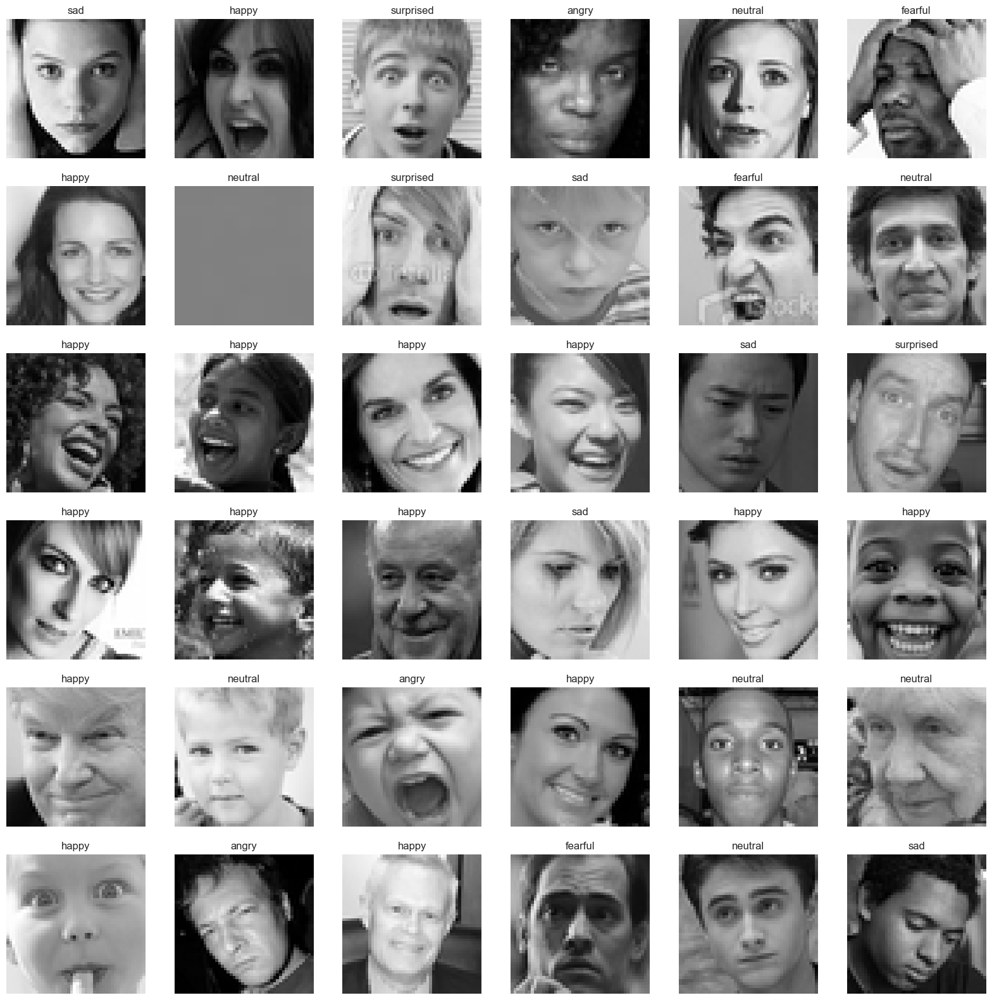

In [14]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [15]:
X_test = []
y_test = []
for folder in  os.listdir(testpath ) : 
    files = gb.glob(pathname= str( testpath + folder + '/*.png'))
    for file in files: 
        image = cv2.imread(file)
        X_test.append(list(image))
        y_test.append(code[folder])
        

In [16]:
print(f'we have {len(X_test)} items in X_test')

we have 7178 items in X_test


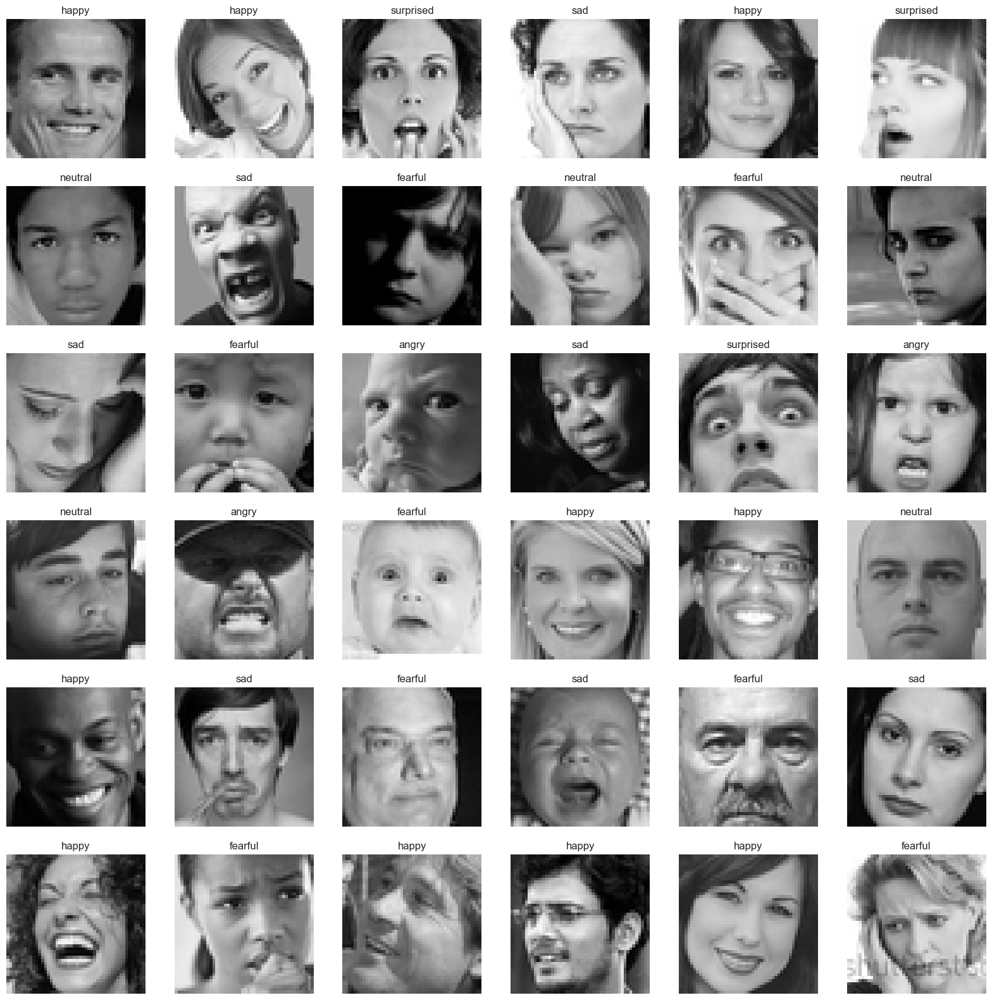

In [17]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])   
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [18]:
### for Jupyter
trainpath = 'Emotion_Detection/train/'
testpath = 'Emotion_Detection/test/'

In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Using IDG to load images from directory
train_idg = ImageDataGenerator(rescale=1./255, validation_split=0.3) # 30 percent validation split for taining 
test_idg = ImageDataGenerator(rescale=1./255)

# Specify parameters/arguments for data generation
img_size = (48, 48)
batch_size = 64

arg_train = {'target_size': img_size,
             'color_mode': 'grayscale',
             'class_mode' : 'categorical',
             'batch_size': batch_size}
arg_test = {'target_size': img_size,
            'color_mode': 'grayscale',
            'class_mode' : 'categorical',
            'batch_size': batch_size,
            'shuffle': False}

train = train_idg.flow_from_directory(directory=trainpath, subset='training', **arg_train)
valid = train_idg.flow_from_directory(directory=trainpath, subset='validation', **arg_train)
test  = test_idg.flow_from_directory(directory=testpath, **arg_test)

Found 20099 images belonging to 7 classes.
Found 8610 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


In [20]:
import tensorflow as tf
from tensorflow.keras.layers import Activation, Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization

In [21]:
model = tf.keras.Sequential()

model.add(Conv2D(32,(3,3),padding='same',kernel_initializer='he_normal',input_shape=(48,48,1)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(32,(3,3),padding='same',kernel_initializer='he_normal',input_shape=(48,48,1)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))


model.add(Conv2D(64,(3,3),padding='same',kernel_initializer='he_normal'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(64,(3,3),padding='same',kernel_initializer='he_normal'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(128,(3,3),padding='same',kernel_initializer='he_normal'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(128,(3,3),padding='same',kernel_initializer='he_normal'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(256,(3,3),padding='same',kernel_initializer='he_normal'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(256,(3,3),padding='same',kernel_initializer='he_normal'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Flatten())
model.add(Dense(64,kernel_initializer='he_normal'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))


model.add(Dense(64,kernel_initializer='he_normal'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))


model.add(Dense(7,kernel_initializer='he_normal'))
model.add(Activation('softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 48, 32)        320       
                                                                 
 activation (Activation)     (None, 48, 48, 32)        0         
                                                                 
 batch_normalization (Batch  (None, 48, 48, 32)        128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 48, 48, 32)        9248      
                                                                 
 activation_1 (Activation)   (None, 48, 48, 32)        0         
                                                                 
 batch_normalization_1 (Bat  (None, 48, 48, 32)        128       
 chNormalization)                                       

In [22]:
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.0005),loss='categorical_crossentropy',metrics=['accuracy'])


In [30]:
history = model.fit(train ,validation_data=valid,epochs=20)

Epoch 1/20
315/315 [==============================] - 105s 333ms/step - loss: 0.7373 - accuracy: 0.7387 - val_loss: 1.2370 - val_accuracy: 0.5913
Epoch 2/20
315/315 [==============================] - 111s 351ms/step - loss: 0.7309 - accuracy: 0.7477 - val_loss: 1.2369 - val_accuracy: 0.5885
Epoch 3/20
315/315 [==============================] - 110s 351ms/step - loss: 0.7268 - accuracy: 0.7438 - val_loss: 1.2040 - val_accuracy: 0.5935
Epoch 4/20
315/315 [==============================] - 107s 338ms/step - loss: 0.6426 - accuracy: 0.7798 - val_loss: 1.2341 - val_accuracy: 0.6069
Epoch 5/20
315/315 [==============================] - 107s 341ms/step - loss: 0.5884 - accuracy: 0.7982 - val_loss: 1.2941 - val_accuracy: 0.5976
Epoch 6/20
315/315 [==============================] - 106s 336ms/step - loss: 0.5666 - accuracy: 0.8052 - val_loss: 1.3337 - val_accuracy: 0.6030
Epoch 7/20
315/315 [==============================] - 106s 336ms/step - loss: 0.5613 - accuracy: 0.8109 - val_loss: 1.4251 -

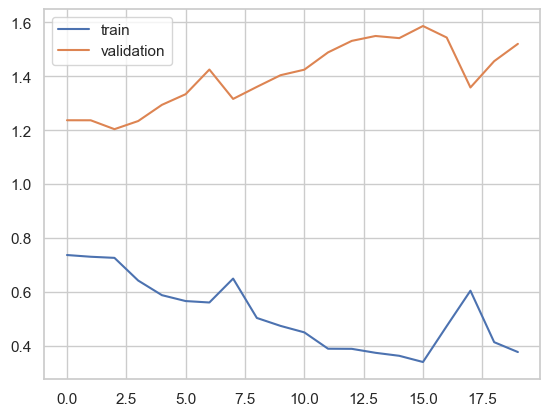

In [32]:
plt.plot(history.history['loss'],label='train')
plt.plot(history.history['val_loss'],label='validation')
plt.legend()
plt.show()

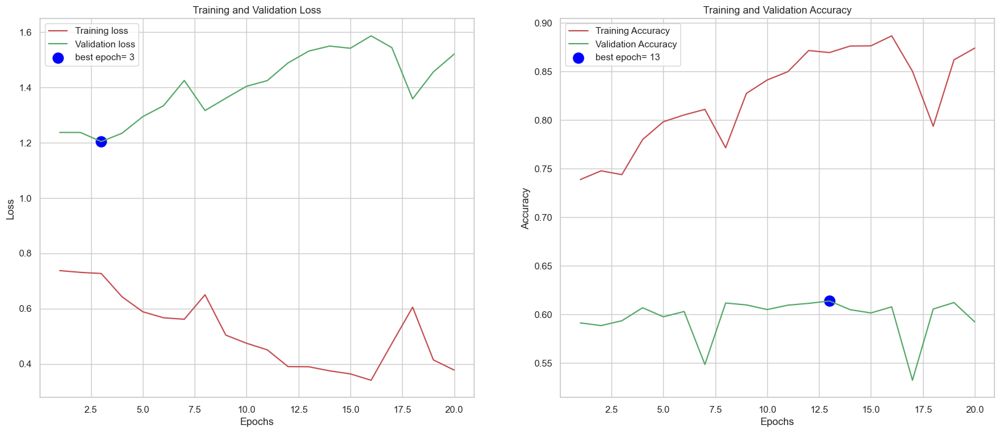

In [31]:
train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
highest_acc = val_acc[index_acc]
Epochs = [i+1 for i in range(len(train_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history

plt.figure(figsize= (20, 8))
# plt.style.use('fivethirtyeight')

plt.subplot(121)
plt.plot(Epochs, train_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(122)
plt.plot(Epochs, train_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , highest_acc,s=150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()